# Install Detectron2



In [ ]:
!pip install pyyaml==5.1
# !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html
# exit()  # restart runtime

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/base_command.py", line 180, in _main
    status = self.run(options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/cli/req_command.py", line 199, in wrapper
    return func(self, options, args)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/commands/install.py", line 412, in run
    env = get_environment(lib_locations)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/metadata/__init__.py", line 29, in get_environment
    return Environment.from_paths(paths)
  File "/usr/local/lib/python3.7/dist-packages/pip/_internal/metadata/pkg_resources.py", line 84, in from_paths
    return cls(pkg_resources.WorkingSet(paths))
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 567, in __init__
    self.add_entry(entry)
  File "/usr/local/lib/python3.7/dist-packages/pip/_vendor/pkg_resources/__init__.py", line 623, 

In [ ]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.9")   # please manually install torch 1.9 if Colab changes its default version

1.9.0+cu102 True


In [ ]:
# Detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# Common Libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# Detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# Run a pre-trained detectron2 model on Max's Picture

This is just something quick to familiarize with detectron2 real quick

[Resource 1](https://www.kaggle.com/ikaynov/detectron2-retinanet-inference)

[for deeper understanding of detecron2](https://medium.com/@hirotoschwert/digging-into-detectron-2-47b2e794fabd)

[config params](https://detectron2.readthedocs.io/en/latest/modules/config.html)

[Base Retinanet config](https://github.com/facebookresearch/detectron2/blob/main/configs/Base-RetinaNet.yaml)

In [ ]:
from pprint import pprint
cfg = get_cfg()
pprint(cfg['MODEL'])
pprint(cfg['MODEL']['RETINANET'])

{'ANCHOR_GENERATOR': {'ANGLES': [[-90, 0, 90]],
                      'ASPECT_RATIOS': [[0.5, 1.0, 2.0]],
                      'NAME': 'DefaultAnchorGenerator',
                      'OFFSET': 0.0,
                      'SIZES': [[32, 64, 128, 256, 512]]},
 'BACKBONE': CfgNode({'NAME': 'build_resnet_backbone', 'FREEZE_AT': 2}),
 'DEVICE': 'cuda',
 'FPN': {'FUSE_TYPE': 'sum',
         'IN_FEATURES': [],
         'NORM': '',
         'OUT_CHANNELS': 256},
 'KEYPOINT_ON': False,
 'LOAD_PROPOSALS': False,
 'MASK_ON': False,
 'META_ARCHITECTURE': 'GeneralizedRCNN',
 'PANOPTIC_FPN': {'COMBINE': {'ENABLED': True,
                              'INSTANCES_CONFIDENCE_THRESH': 0.5,
                              'OVERLAP_THRESH': 0.5,
                              'STUFF_AREA_LIMIT': 4096},
                  'INSTANCE_LOSS_WEIGHT': 1.0},
 'PIXEL_MEAN': [103.53, 116.28, 123.675],
 'PIXEL_STD': [1.0, 1.0, 1.0],
 'PROPOSAL_GENERATOR': CfgNode({'NAME': 'RPN', 'MIN_SIZE': 0}),
 'RESNETS': {'DEFORM_MOD

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.
model_final_971ab9.pkl: 228MB [00:22, 10.2MB/s]                           
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  anchor_generator.cell_anchors.{0, 1, 2, 3, 4}
/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.

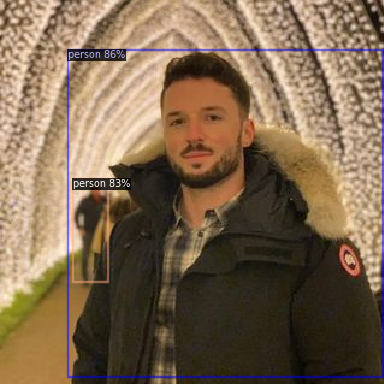

In [ ]:
!wget https://pkimgcdn.peekyou.com/70460190dccf62e530ba46a6982b1d4d.jpeg -q -O input.jpg
im = cv2.imread("./input.jpg")
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.8 # Required for RETINANET
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
# print(outputs["instances"].pred_classes)
# print(outputs["instances"].pred_boxes)
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2) # we have to reverse the color order otherwise we'll get blue images (BGR -> RGB)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

# Create Dataset

## Set up detect_energy

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/pypsa-meets-africa/detect_energy.git

Cloning into 'detect_energy'...
remote: Enumerating objects: 394, done.
remote: Counting objects: 100% (394/394), done.
remote: Compressing objects: 100% (217/217), done.
remote: Total 394 (delta 220), reused 339 (delta 173), pack-reused 0
Receiving objects: 100% (394/394), 8.27 MiB | 16.79 MiB/s, done.
Resolving deltas: 100% (220/220), done.


In [ ]:
!pip install geopandas rtree 


     |████████████████████████████████| 994 kB 2.7 MB/s 
     |████████████████████████████████| 994 kB 36.1 MB/s 
     |████████████████████████████████| 15.4 MB 39 kB/s 
     |████████████████████████████████| 6.3 MB 1.6 MB/s 


In [ ]:
import os
import importlib
import sys
sys.path.append(os.getcwd()+'/detect_energy/image_download/')
import geopandas as gpd
import pandas as pd

In [ ]:
# from main import make_all_examples
# from create_coco_format import to_coco
# from filter_tiles import filter_images, verify_df_img
import main
import create_coco_format
import filter_tiles
import make_examples

In [ ]:
importlib.reload(create_coco_format)
importlib.reload(main)
importlib.reload(filter_tiles)

<module 'filter_tiles' from '/content/detect_energy/image_download/filter_tiles.py'>

## Poor Man's Colab Shell

In [ ]:
from IPython.display import JSON
from google.colab import output
from subprocess import getoutput
import os

def shell(command):
  if command.startswith('cd'):
    path = command.strip().split(maxsplit=1)[1]
    os.chdir(path)
    return JSON([''])
  return JSON([getoutput(command)])
output.register_callback('shell', shell)

In [ ]:
#@title Colab Shell
%%html
<div id=term_demo></div>
<script src="https://code.jquery.com/jquery-latest.js"></script>
<script src="https://cdn.jsdelivr.net/npm/jquery.terminal/js/jquery.terminal.min.js"></script>
<link href="https://cdn.jsdelivr.net/npm/jquery.terminal/css/jquery.terminal.min.css" rel="stylesheet"/>
<script>
  $('#term_demo').terminal(async function(command) {
      if (command !== '') {
          try {
              let res = await google.colab.kernel.invokeFunction('shell', [command])
              let out = res.data['application/json'][0]
              this.echo(new String(out))
          } catch(e) {
              this.error(new String(e));
          }
      } else {
          this.echo('');
      }
  }, {
      greetings: 'Welcome to Colab Shell',
      name: 'colab_demo',
      height: 250,
      prompt: 'colab > '
  });

## Create Examples

#### Switch Directories

In [ ]:
os.getcwd()

'/content'

In [ ]:
!pwd

/content


In [ ]:
# %cd ../../../../../
# %cd ..

In [ ]:
# %cd drive/MyDrive/PyPSA_Africa_images/new_examples/
%cd drive/MyDrive/PyPSA_Africa_images/newer_examples/

/content/drive/.shortcut-targets-by-id/1pMhI9rIgnuKcDAsGFtXv8j0Vxg2vNqyE/PyPSA_Africa_images/newer_examples


#### Copied from main (pipeline)

In [ ]:
sl_max=600
gn_max=600

# SIERRA LEONE
print("Making Examples for Sierra Leone!")

# assess satellite imagery
polygons_sl = make_examples.make_polygon_list("./../sierra_leone/raw/")
towers_file = "./../sierra_leone/raw/sierra-leone_raw_towers.geojson"

# creates the examples
make_examples.make_examples(towers_file, 
              polygons_sl, 
              img_path="/SL_", 
              max_length=sl_max,
              random_offset= True, 
              seed=2021)

# GHANA
print("Making Examples for Ghana!")

# assess satellite imagery
polygons_gh = make_examples.make_polygon_list("./../ghana/raw/")
towers_file = "./../ghana/raw/ghana_raw_towers.geojson"

# creates the examples
make_examples.make_examples(towers_file, 
              polygons_gh, 
              img_path="/GH_", 
              max_length=gn_max,
              random_offset= True, 
              seed=2021)

# merge the respective dataframes
sl = gpd.read_file("SL_tower_examples.geojson")
gh = gpd.read_file("GH_tower_examples.geojson")
merged = gpd.GeoDataFrame(pd.concat([sl, gh], ignore_index=True))
merged.to_file("tower_examples.geojson", driver="GeoJSON")

print("Merged Dataframes!")
def split_data(df_dir, df, train_ratio=0.8, seed=202):
    train=df.sample(frac=train_ratio,random_state=seed) #random state is a seed value
    test=df.drop(train.index)
    train.to_file(df_dir + "tower_train.geojson", driver="GeoJSON")

Making Examples for Sierra Leone!
Maxiumum Number of Examples: 658
Created 10 Examples!
Created 20 Examples!
Created 30 Examples!
Created 40 Examples!
Created 50 Examples!
Created 60 Examples!
Created 70 Examples!
Created 80 Examples!
Created 90 Examples!
Created 100 Examples!
Created 110 Examples!
Created 120 Examples!
Created 130 Examples!
Created 140 Examples!
Created 150 Examples!
Created 160 Examples!
Created 170 Examples!
Created 180 Examples!
Created 190 Examples!
Created 200 Examples!
Created 210 Examples!
Created 220 Examples!
Created 230 Examples!
Created 240 Examples!
Created 250 Examples!
Created 260 Examples!
Created 270 Examples!
Created 280 Examples!
Created 290 Examples!
Created 300 Examples!
Created 310 Examples!
Created 320 Examples!
Created 330 Examples!
Created 340 Examples!
Created 350 Examples!
Created 360 Examples!
Created 370 Examples!
Created 380 Examples!
Created 390 Examples!
Created 400 Examples!
Created 410 Examples!
Created 420 Examples!
Created 430 Exampl

#### Filter Tiles

In [ ]:
filter_tiles.filter_images('tower_examples.geojson', delete_filtered=True, black_point=50, dark_threshold=.5, white_point=150, cloudy_threshold=.45, blurry_threshold=.65)

Black Border Detected! for SL_20881698780.png
Cloudy Image Detected! for SL_21781684180.png
Dark Image Detected! for SL_21781684260.png
Blurry Image Detected! for SL_21781684130.png
Cloudy Image Detected! for SL_21781684220.png
Blurry Image Detected! for SL_21781684240.png
Cloudy Image Detected! for SL_21781684230.png
Blurry Image Detected! for SL_21781684270.png
Blurry Image Detected! for SL_21781684140.png
Cloudy Image Detected! for SL_21781684170.png
Blurry Image Detected! for SL_21781684280.png
Black Border Detected! for SL_21790805360.png
Black Border Detected! for SL_21790805300.png
Black Border Detected! for SL_21790805340.png
Black Border Detected! for SL_21790805280.png
Black Border Detected! for SL_21790805260.png
Black Border Detected! for SL_21781781130.png
Black Border Detected! for SL_21790805250.png
Black Border Detected! for SL_21790805330.png
Black Border Detected! for SL_21790805320.png
Black Border Detected! for SL_21790805290.png
Black Border Detected! for SL_217908

,filename,ul_x,ul_y,lr_x,lr_y,geometry
0,SL_24789710090.png,109.0,337.0,139.0,361.0,"POLYGON ((-12.04160 8.90069, -12.03931 8.90069..."
1,SL_20881698210.png,50.0,124.0,80.0,148.0,"POLYGON ((-12.12051 8.87368, -12.11822 8.87368..."
2,SL_21781780780.png,102.0,346.0,132.0,370.0,"POLYGON ((-12.02031 8.91379, -12.01803 8.91379..."
3,SL_21790804960.png,463.0,40.0,493.0,64.0,"POLYGON ((-12.00875 8.92168, -12.00647 8.92168..."
4,SL_24797777870.png,311.0,471.0,341.0,495.0,"POLYGON ((-12.07264 8.88889, -12.07036 8.88889..."
...,...,...,...,...,...,...
919,GH_30639699170.png,133.0,447.0,163.0,471.0,"POLYGON ((-2.43380 9.51106, -2.43208 9.51106, ..."
921,GH_30639696800.png,271.0,226.0,301.0,250.0,"POLYGON ((-2.43136 9.31978, -2.42964 9.31978, ..."
922,GH_30639700540.png,361.0,348.0,391.0,372.0,"POLYGON ((-2.45832 9.63733, -2.45661 9.63733, ..."
923,GH_30639701820.png,339.0,159.0,369.0,183.0,"POLYGON ((-2.45978 9.85655, -2.45806 9.85655, ..."


#### Verify Dataframe

In [ ]:
filter_tiles.verify_df_img('tower_examples_clean.geojson')

All Test Passed


True

#### Create Train Test Splits

In [ ]:
def split_data(gdf_path, train_ratio=0.8, seed=202):
    df = gpd.read_file(gdf_path)
    df_dir = os.path.dirname(os.path.abspath(gdf_path)) +'/'
    train=df.sample(frac=train_ratio,random_state=seed) #random state is a seed value
    val=df.drop(train.index)
    val=val.sample(frac=1,random_state=seed)
    train.to_file(df_dir + "tower_examples_train.geojson", driver="GeoJSON")
    val.to_file(df_dir + "tower_examples_val.geojson", driver="GeoJSON")
    return train, val

train,val = split_data("./tower_examples_clean.geojson", train_ratio=0.8, seed=202)
display(train)
display(val)

,filename,ul_x,ul_y,lr_x,lr_y,geometry
519,GH_26401434380.png,154.0,125.0,184.0,149.0,"POLYGON ((-1.43479 8.84691, -1.43323 8.84691, ..."
609,GH_30639696680.png,43.0,450.0,73.0,474.0,"POLYGON ((-2.42582 9.28350, -2.42411 9.28350, ..."
622,GH_30639696930.png,416.0,55.0,446.0,79.0,"POLYGON ((-2.43241 9.35657, -2.43069 9.35657, ..."
385,SL_76573988970.png,7.0,378.0,37.0,402.0,"POLYGON ((-11.85584 9.06046, -11.85423 9.06046..."
374,SL_76573988900.png,171.0,240.0,201.0,264.0,"POLYGON ((-11.83112 9.04178, -11.82951 9.04178..."
...,...,...,...,...,...,...
481,GH_26227127300.png,56.0,381.0,86.0,405.0,"POLYGON ((-1.41492 8.88112, -1.41337 8.88112, ..."
33,SL_21790805060.png,396.0,413.0,426.0,437.0,"POLYGON ((-11.97035 8.94611, -11.96806 8.94611..."
345,SL_76574011050.png,133.0,37.0,163.0,61.0,"POLYGON ((-11.93179 9.08597, -11.92926 9.08597..."
335,SL_76574011000.png,354.0,195.0,384.0,219.0,"POLYGON ((-11.90094 9.06857, -11.89841 9.06857..."


,filename,ul_x,ul_y,lr_x,lr_y,geometry
189,SL_21790805210.png,306.0,180.0,336.0,204.0,"POLYGON ((-11.91406 8.96787, -11.91156 8.96787..."
689,GH_30639700230.png,37.0,358.0,67.0,382.0,"POLYGON ((-2.44334 9.59268, -2.44163 9.59268, ..."
272,SL_78655573710.png,314.0,237.0,344.0,261.0,"POLYGON ((-11.95105 9.29826, -11.94852 9.29826..."
509,GH_77242365860.png,222.0,386.0,252.0,410.0,"POLYGON ((-1.43321 8.87967, -1.43165 8.87967, ..."
342,SL_78655321560.png,339.0,159.0,369.0,183.0,"POLYGON ((-11.96577 9.21695, -11.96324 9.21695..."
...,...,...,...,...,...,...
444,GH_62997937780.png,120.0,400.0,150.0,424.0,"POLYGON ((-2.47424 10.18164, -2.47249 10.18164..."
513,GH_63000817790.png,173.0,164.0,203.0,188.0,"POLYGON ((-1.37329 8.95209, -1.37173 8.95209, ..."
48,SL_20881698940.png,430.0,110.0,460.0,134.0,"POLYGON ((-12.08226 8.88954, -12.07997 8.88954..."
186,SL_21790805390.png,382.0,132.0,412.0,156.0,"POLYGON ((-11.85444 8.99015, -11.85194 8.99015..."


#### Create COCO Format

In [ ]:
create_coco_format.to_coco("./tower_examples_train.geojson",'_train')
create_coco_format.to_coco("./tower_examples_val.geojson",'_val')

# Training on Satellite Imagery

#### Register COCO Datasets

In [ ]:
os.getcwd()

'/content/drive/.shortcut-targets-by-id/1pMhI9rIgnuKcDAsGFtXv8j0Vxg2vNqyE/PyPSA_Africa_images/newer_examples'

In [ ]:
suffix = '_newer'
for d in ["train", "val"]:
    register_coco_instances("tower_" + d + suffix, {}, f"tower_coco_{d}.json", os.getcwd())

In [ ]:
tower_train_dataset = 'tower_train' + suffix
tower_val_dataset = 'tower_val' + suffix
tower_metadata = MetadataCatalog.get(tower_train_dataset)

#### Visualize the annotations of randomly selected samples in the training set:

[10/02 12:18:27 d2.data.datasets.coco]: Loaded 566 images in COCO format from tower_coco_train.json


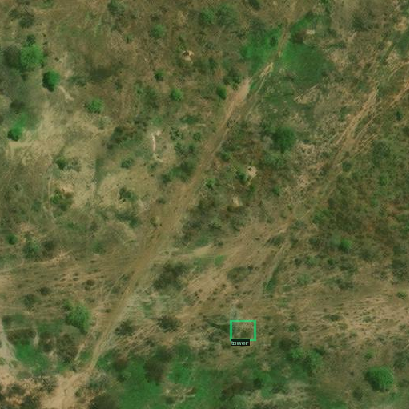

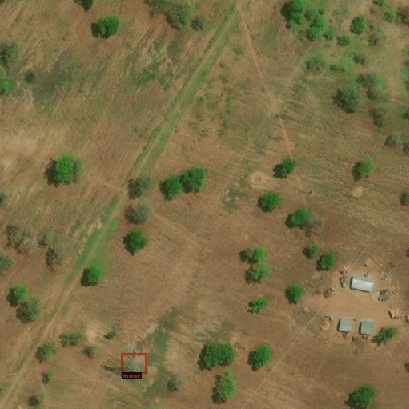

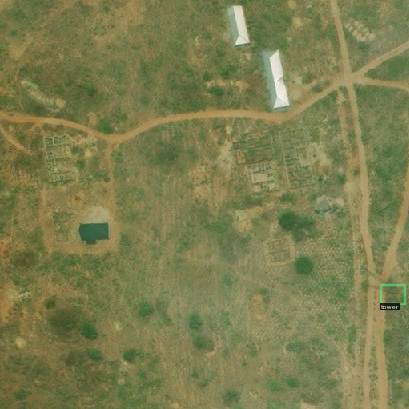

In [ ]:
dataset_dicts = DatasetCatalog.get(tower_train_dataset)
tower_metadata = MetadataCatalog.get(tower_train_dataset)
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=tower_metadata, scale=0.8)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Train Model


In [ ]:
!nvidia-smi

Sat Oct  2 12:18:34 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P8    34W / 149W |      3MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# For a custom training loop a custom training loop can be written as shown in plain_train_net.py https://github.com/facebookresearch/detectron2/tree/master/tools
from detectron2.engine import DefaultTrainer # https://detectron2.readthedocs.io/modules/engine.html?highlight=defaulttrainer#detectron2.engine.defaults.DefaultTrainer

cfg = get_cfg() # Model Config

# From Detectron2 Model Zoo
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))    # https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-Detection/retinanet_R_101_FPN_3x.yaml
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")  # Pre-trained Model Weights

# Set Dataset
cfg.DATASETS.TRAIN = (tower_train_dataset)  # Training Dataset
cfg.DATASETS.TEST = (tower_val_dataset)   # Validation Dataset
cfg.DATASETS.TEST = ()

cfg.DATALOADER.NUM_WORKERS = 2  # Number of CPUs to load the data into Detectron2 - 2 for Colab
cfg.SOLVER.IMS_PER_BATCH = 2    # Detectron2 default 16 with 8 GPUs, so 16/8 = 2 for 1 GPU

# Learning Rate
# default retinanet BASE_LR = 0.01 on 8 GPUs
# using linear learning rate rule, on 1 GPU 0.01/8 = 0.00125
# to prevent other layers from modifying too much, divide by 10: 0.00125/10 = 0.000125
cfg.SOLVER.BASE_LR = 0.000125
cfg.SOLVER.MAX_ITER = 4000
cfg.SOLVER.STEPS = []   # does not decay learning rate

# ROI = region of interest
# is used to sample a subset of proposals coming out of RPN (Region Proposal Network)
# to calculate cls and reg loss during training. 
# calculating loss on all RPN proposals isn't computationally efficient
#-------
# RoI minibatch size *per image* (number of regions of interest [ROIs]) during training
# Total number of RoIs per training minibatch = ROI_HEADS.BATCH_SIZE_PER_IMAGE * SOLVER.IMS_PER_BATCH
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # (default: 512)

# Config for New Datasets (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1   # for R-CNN Models
cfg.MODEL.RETINANET.NUM_CLASSES = 1   # for RetinaNet 

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

Loading config /usr/local/lib/python3.7/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[10/02 12:18:59 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_971ab9.pkl: 228MB [00:22, 10.1MB/s]                           
Skip loading parameter 'head.cls_score.weight' to the model due to incompatible shapes: (720, 256, 3, 3) in the checkpoint but (9, 256, 3, 3) in the model! You might want to double check if this is expected.
Skip loading parameter 'head.cls_score.bias' to the model due to incompatible shapes: (720,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
head.cls_score.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


[10/02 12:19:25 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


[10/02 12:20:05 d2.utils.events]:  eta: 2:15:36  iter: 19  total_loss: 1.378  loss_cls: 0.7622  loss_box_reg: 0.681  time: 2.0433  data_time: 0.0161  lr: 2.4976e-06  max_mem: 2228M
[10/02 12:20:35 d2.utils.events]:  eta: 1:44:54  iter: 39  total_loss: 1.945  loss_cls: 1.009  loss_box_reg: 0.8546  time: 1.7615  data_time: 0.0065  lr: 4.9951e-06  max_mem: 2228M
[10/02 12:21:04 d2.utils.events]:  eta: 1:43:15  iter: 59  total_loss: 1.819  loss_cls: 1.055  loss_box_reg: 0.762  time: 1.6500  data_time: 0.0068  lr: 7.4926e-06  max_mem: 2228M
[10/02 12:21:33 d2.utils.events]:  eta: 1:42:03  iter: 79  total_loss: 1.668  loss_cls: 0.9848  loss_box_reg: 0.7023  time: 1.5934  data_time: 0.0067  lr: 9.9901e-06  max_mem: 2228M
[10/02 12:22:02 d2.utils.events]:  eta: 1:37:58  iter: 99  total_loss: 1.753  loss_cls: 1.017  loss_box_reg: 0.6913  time: 1.5650  data_time: 0.0071  lr: 1.2488e-05  max_mem: 2228M
[10/02 12:22:31 d2.utils.events]:  eta: 1:37:28  iter: 119  total_loss: 1.486  loss_cls: 0.8986

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Output hidden; open in https://colab.research.google.com to view.

## Inference & evaluation using the trained model
Create a predictor



In [ ]:
# Inference should use the config with parameters that are used in training
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5 # For RetinaNet
# cfg.MODEL.RETINANET.NMS_THRESH_TEST = 0.5 # For RetinaNet (optional)
cfg.TEST.DETECTIONS_PER_IMAGE = 1 # Not sure, but makes sense
predictor = DefaultPredictor(cfg)

Visualize the prediction results


In [ ]:
from detectron2.utils.visualizer import ColorMode
num_to_draw = 1 # assuming 1 tower per tile
val_dataset_dicts = DatasetCatalog.get(tower_val_dataset)
for d in random.sample(val_dataset_dicts, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    # print(outputs)
    v = Visualizer(im[:, :, ::-1],
                   metadata=tower_metadata, 
                   scale=0.8
    )
    # print(outputs["instances"].to("cpu"))
    # out = v.draw_instance_predictions(outputs["instances"][:num_to_draw].to("cpu")) # Draw num_to_draw boxes
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

Output hidden; open in https://colab.research.google.com to view.

Evaluation using AP metric implemented in COCO API.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Using COCO Evaluator https://detectron2.readthedocs.io/modules/evaluation.html#detectron2.evaluation.COCOEvaluator
# evaluator = COCOEvaluator(tower_val_dataset)
evaluator = COCOEvaluator(tower_val_dataset, cfg, False, output_dir="./output/")

# Data loader
val_loader = build_detection_test_loader(cfg, tower_val_dataset)

# Inference
inference_on_dataset(model=trainer.model,
                     data_loader=val_loader, 
                     evaluator=evaluator)

# another equivalent way to evaluate the model is to use `trainer.test`
# trainer.test(cfg=cfg,
#              model=trainer.model,
#              evaluator=evaluator)

WARNING [10/02 14:18:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/02 14:18:44 d2.data.datasets.coco]: Loaded 142 images in COCO format from tower_coco_val.json
[10/02 14:18:44 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   tower    | 142          |
|            |              |
[10/02 14:18:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/02 14:18:44 d2.data.common]: Serializing 142 elements to byte tensors and concatenating them all ...
[10/02 14:18:44 d2.data.common]: Serialized dataset takes 0.05 MiB
[10/02 14:18:44 d2.evaluation.evaluator]: Start inference on 142 batches
[10/02 14:18:48 d2.evaluation.evaluator]: Inference done 11/142. Dataloading: 0.0015 s/iter. Inference: 0.

OrderedDict([('bbox',
              {'AP': 3.4413516831259616,
               'AP50': 14.746313875176554,
               'AP75': 0.3511561813067476,
               'APl': nan,
               'APm': nan,
               'APs': 3.4413563137240852})])